# DA24C024

In [1]:
import numpy as np
import pandas as pd
import random
import os
from PIL import Image
from sklearn.manifold import Isomap, TSNE
import matplotlib.pyplot as plt
from matplotlib import offsetbox
#importing libraries

In [2]:
data = pd.read_csv("C:/Users/Mansha/Downloads/train.csv")
data.head()
#importing data

,id,Category,len,attr_1,attr_2,attr_3,attr_4,attr_5,attr_6,attr_7,attr_8,attr_9,attr_10
0,0,Men Tshirts,5,default,round,printed,default,short sleeves,NaN,NaN,NaN,NaN,NaN
1,1,Men Tshirts,5,multicolor,polo,solid,solid,short sleeves,NaN,NaN,NaN,NaN,NaN
2,2,Men Tshirts,5,default,polo,solid,solid,short sleeves,NaN,NaN,NaN,NaN,NaN
3,3,Men Tshirts,5,multicolor,polo,solid,solid,short sleeves,NaN,NaN,NaN,NaN,NaN
4,4,Men Tshirts,5,multicolor,polo,solid,solid,short sleeves,NaN,NaN,NaN,NaN,NaN


In [3]:
data.describe(include='all')


,id,Category,len,attr_1,attr_2,attr_3,attr_4,attr_5,attr_6,attr_7,attr_8,attr_9,attr_10
count,70213.000000,70213,70213.000000,51867,55192,54698,59888,56493,38116,41415,37474,33565,24999
unique,NaN,5,NaN,18,14,10,19,14,7,11,10,13,8
top,NaN,Women Tops & Tunics,NaN,default,regular,regular,printed,casual,short sleeves,regular sleeves,zari woven,regular sleeves,no
freq,NaN,19004,NaN,9268,17222,15546,14285,12358,13703,14661,13533,7480,14835
mean,35254.985872,NaN,8.850569,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,20295.174166,NaN,1.559819,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,0.000000,NaN,5.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,17718.000000,NaN,8.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,35272.000000,NaN,10.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,52825.000000,NaN,10.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Task 1

In [4]:
# Generating random samples for each category-attribute pair
product_categories = ["Men Tshirts", "Sarees", "Kurtis", "Women Tshirts", "Women Tops & Tunics"]
sample_baskets = {}
random.seed(41)
for category in product_categories:
    available_attributes = ["attr_1", "attr_2", "attr_3", "attr_4", "attr_5", "attr_6", "attr_7", "attr_8", "attr_9", "attr_10"]
    count = 0
    while count < 2:
        selected_attr = random.choice(available_attributes)
        filtered_data = data[(data['Category'] == category) & (data[selected_attr].notna())]
        if len(filtered_data) >= 100:
            sample_baskets[f'{category}_{selected_attr}'] = filtered_data['id'].sample(100).tolist()
            count += 1
            available_attributes.remove(selected_attr)

print(sample_baskets.items())
# Ths is 10 sample baskets for all 5 different categories with random attributes.


dict_items([('Men Tshirts_attr_4', [5019, 6046, 77, 3633, 1090, 6893, 280, 1923, 6441, 7300, 3572, 2915, 646, 2371, 463, 1787, 6791, 4277, 4608, 741, 6125, 3554, 5924, 2958, 4800, 1304, 3905, 4032, 1203, 2249, 1722, 2826, 765, 1856, 537, 1319, 4511, 5092, 1937, 3184, 3929, 4408, 4423, 5101, 2079, 2239, 1265, 3015, 3675, 992, 5295, 3920, 6873, 2222, 2131, 6681, 2755, 3138, 3408, 2134, 1914, 700, 5669, 5692, 2802, 4951, 2465, 855, 2257, 3097, 2144, 2291, 4477, 2658, 2254, 3122, 1056, 24, 5352, 2234, 1413, 2161, 3775, 1358, 5663, 4785, 2892, 593, 1990, 1094, 6126, 4094, 2160, 142, 1921, 30, 4239, 7077, 3652, 4182]), ('Men Tshirts_attr_3', [6502, 2660, 2677, 4122, 6248, 624, 6445, 1869, 2967, 1693, 3022, 2845, 1237, 1144, 1539, 5470, 5058, 4046, 127, 885, 5322, 6434, 985, 671, 859, 5500, 3151, 3785, 3888, 1071, 5099, 2946, 5402, 1708, 5308, 6597, 3125, 3892, 5227, 4558, 1041, 1850, 1052, 1467, 272, 289, 5575, 1830, 6515, 5363, 1737, 919, 4272, 987, 2323, 3379, 5520, 2621, 4124, 1809, 2938,

In [5]:
sample_baskets.keys()
#chosen categories with attributes

dict_keys(['Men Tshirts_attr_4', 'Men Tshirts_attr_3', 'Sarees_attr_7', 'Sarees_attr_5', 'Kurtis_attr_9', 'Kurtis_attr_5', 'Women Tshirts_attr_7', 'Women Tshirts_attr_1', 'Women Tops & Tunics_attr_4', 'Women Tops & Tunics_attr_1'])

# Task 2 and 3

In [6]:
def load_and_preprocess_images(image_ids):
    images_data = []
    original_images = []
    for product_id in image_ids:
        formatted_id = str(product_id).zfill(6)
        img_path = f"C:/Users/Mansha/Downloads/train_images/{formatted_id}.jpg"
        img = Image.open(img_path).resize((64, 64))
        images_data.append(np.array(img).flatten())
        original_images.append(img)
    return np.array(images_data), original_images
#preprocesssing images


In [29]:
def plot_with_model(data_points, model, images=None, axis=None, thumbnail_fraction=0.05, color_map='gray', title=""):
    axis = axis or plt.gca()
    projected_data = model.fit_transform(data_points)
    axis.plot(projected_data[:, 0], projected_data[:, 1], '.k')

    if images is not None:
        min_distance = (thumbnail_fraction * max(projected_data.max(0) - projected_data.min(0))) ** 2
        displayed_images = np.array([2 * projected_data.max(0)])
        for i in range(data_points.shape[0]):
            dist = np.sum((projected_data[i] - displayed_images) ** 2, 1)
            if np.min(dist) < min_distance:
                continue
            displayed_images = np.vstack([displayed_images, projected_data[i]])
            image_box = offsetbox.AnnotationBbox(
                offsetbox.OffsetImage(images[i], cmap=color_map),
                projected_data[i]
            )
            axis.add_artist(image_box)
    plt.title(title, size=20)
    plt.gcf().set_size_inches(15, 10)
    #function to plot images


In [8]:

# Initialize projection models- ISOMAP AND T-SNE
isomap_model = Isomap(n_neighbors=5, n_components=2)
tsne_model = TSNE(n_components=2, random_state=42)


Now we will visualize by category and attribute and interpret the plots.

# Men's T-shirt's 

Attribute 4

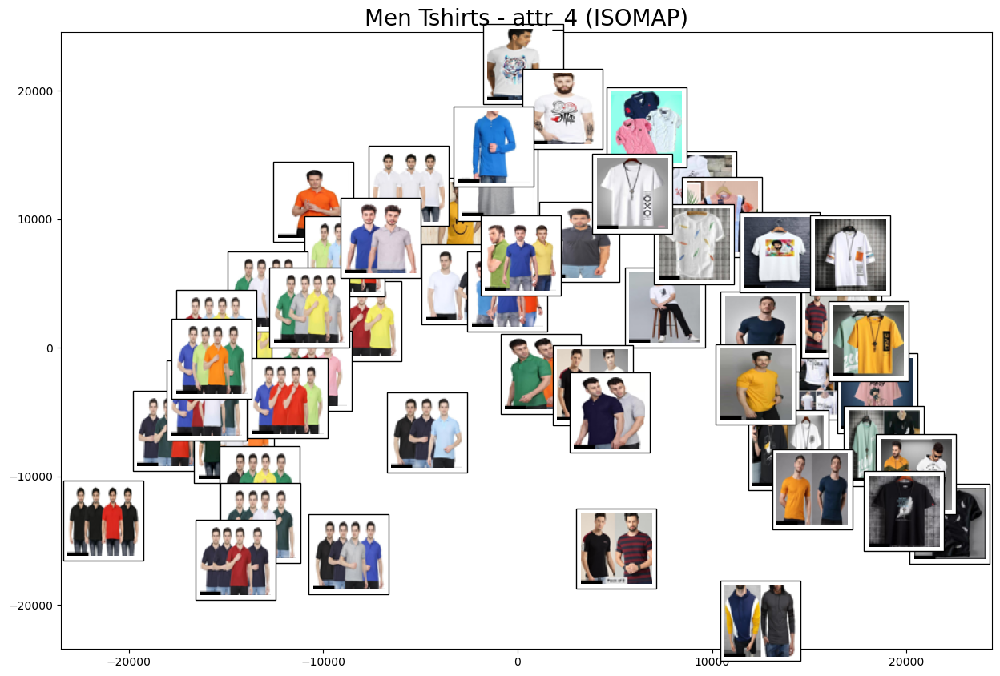

In [9]:
category_name = "Men Tshirts"
attribute_name = "attr_4"
images_data, original_images = load_and_preprocess_images(sample_baskets[f"{category_name}_{attribute_name}"])
plot_with_model(images_data, isomap_model, original_images, title=f"{category_name} - {attribute_name} (ISOMAP)")


ISOMAP: The component along X axis seems to graphics since all tshirts towards the left are solid and towards right are printed
The component along y axis seems to be color as lower y values appear to correspond to darker colors like black and higher y values to lighter colors like white.

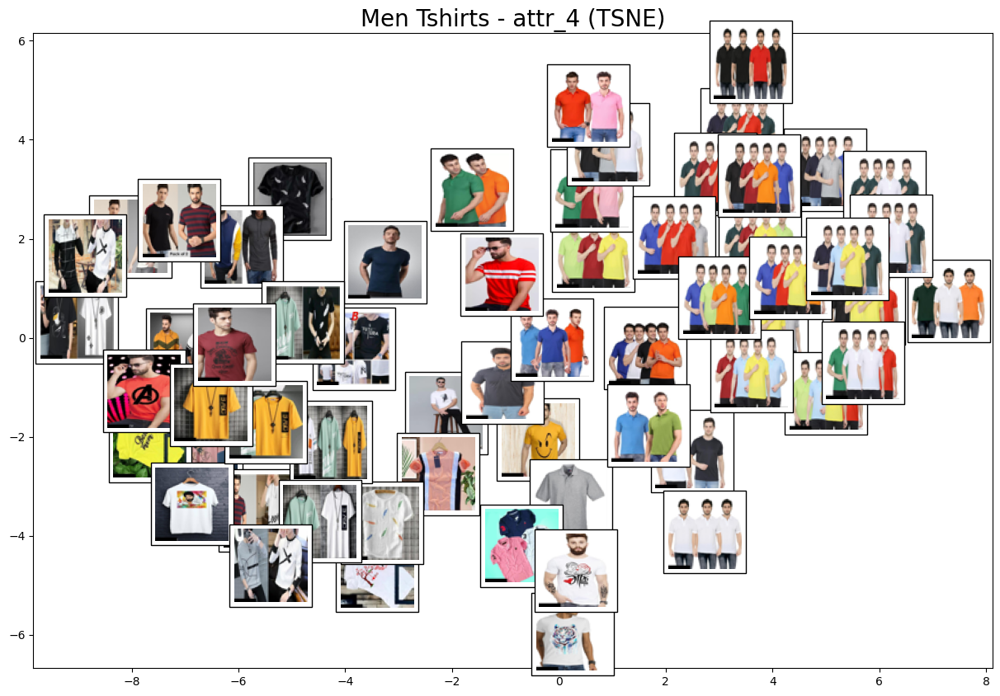

In [10]:
plot_with_model(images_data, tsne_model, original_images, title=f"{category_name} - {attribute_name} (TSNE)")


TSNE: seems to group on the basis of color of the tshirt- i.e. similar shades of tshirts are closer.

Attribute 3

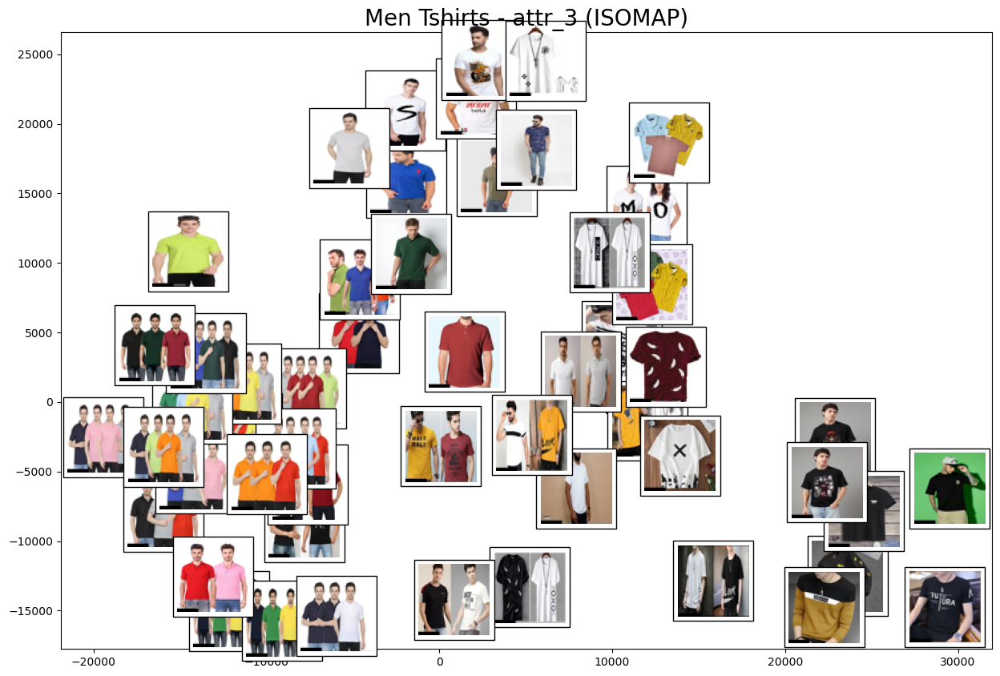

In [11]:
images_data, original_images = load_and_preprocess_images(sample_baskets[f"{category_name}_{attribute_name}"])
plot_with_model(images_data, isomap_model, original_images, title=f"{category_name} - {attribute_name} (ISOMAP)")


There are distinct clusters for plain t-shirts, printed t-shirts, and those with specific logos or patterns. Within these clusters, there are further subdivisions based on color palette.

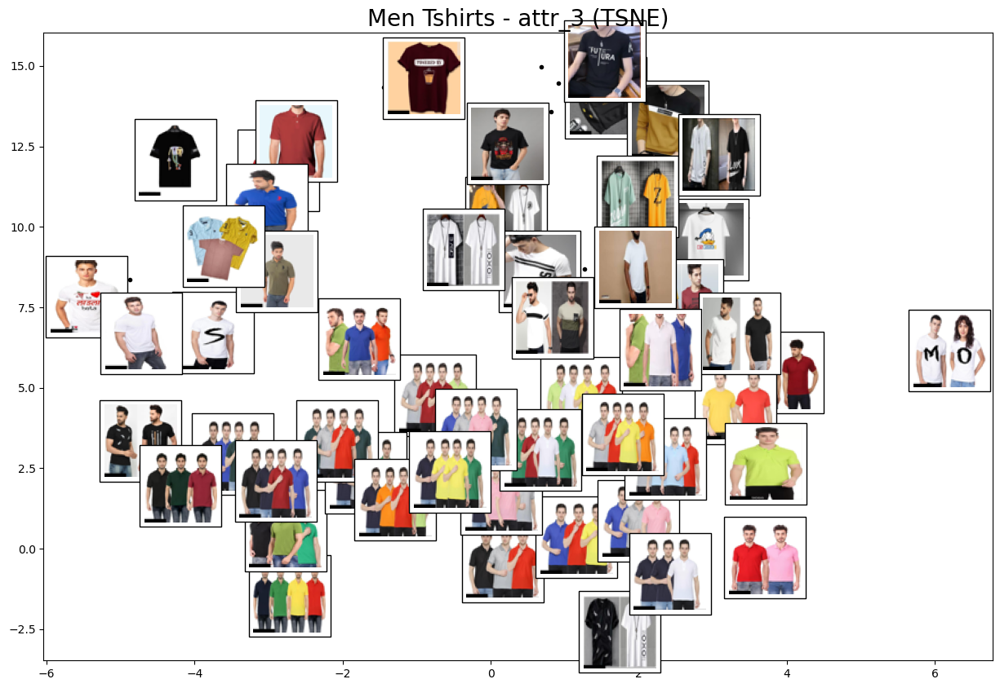

In [12]:
plot_with_model(images_data, tsne_model, original_images, title=f"{category_name} - {attribute_name} (TSNE)")


The t-SNE plot clusters t-shirts based on visual similarity.  There are clusters for plain t-shirts, printed t-shirts, and those with logos.

# Women Sarees

Attribute 7

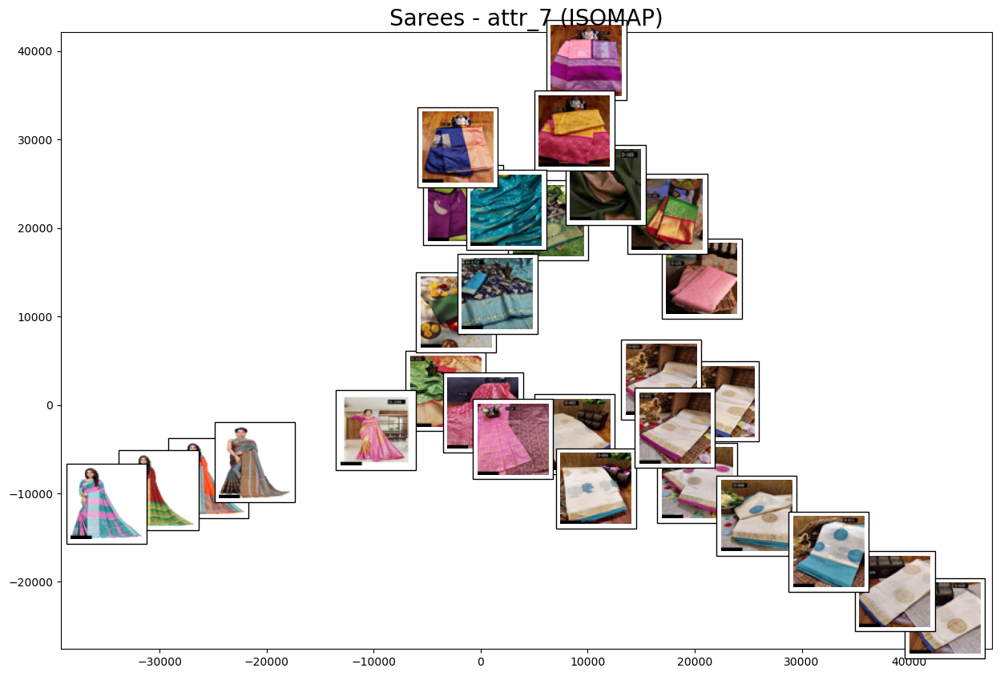

In [13]:
category_name = "Sarees"
attribute_name = "attr_7"
images_data, original_images = load_and_preprocess_images(sample_baskets[f"{category_name}_{attribute_name}"])
plot_with_model(images_data, isomap_model, original_images, title=f"{category_name} - {attribute_name} (ISOMAP)")



There are distinct clusters for sarees with similar and patterns ( floral, geometric, striped) regardless of color palette.









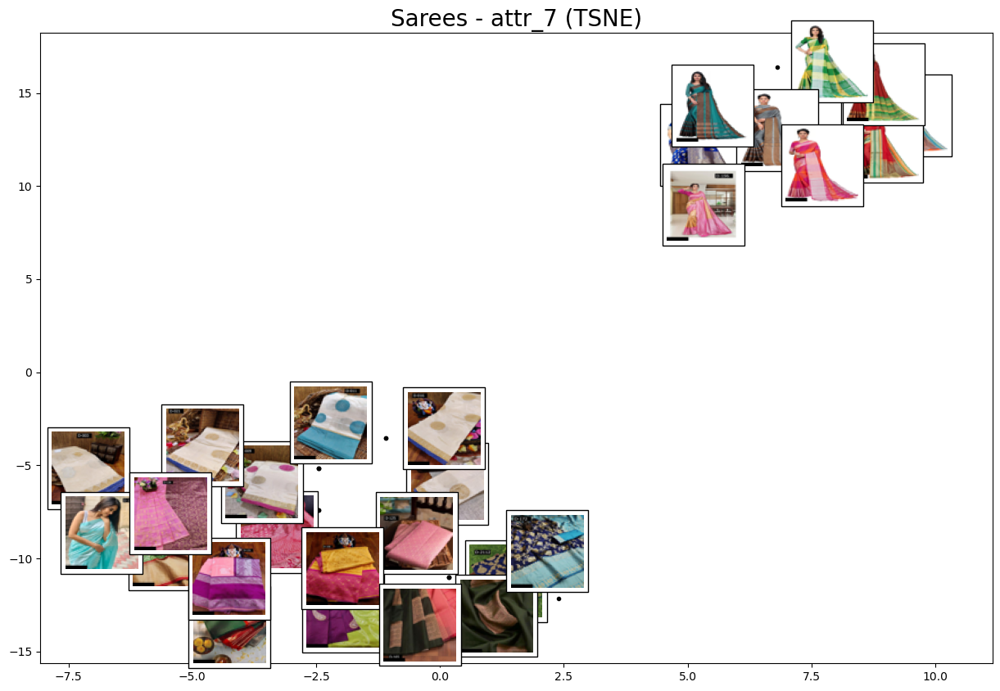

In [14]:
plot_with_model(images_data, tsne_model, original_images, title=f"{category_name} - {attribute_name} (TSNE)")


Here the clusters are on the basis of pattern but also sarees with similar color palettes are closer within the cluster

Attribute 5

c:\Users\Mansha\anaconda3\Lib\site-packages\sklearn\manifold\_isomap.py:383: UserWarning: The number of connected components of the neighbors graph is 3 > 1. Completing the graph to fit Isomap might be slow. Increase the number of neighbors to avoid this issue.
  self._fit_transform(X)
c:\Users\Mansha\anaconda3\Lib\site-packages\scipy\sparse\_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_intXint(row, col, x.flat[0])
c:\Users\Mansha\anaconda3\Lib\site-packages\scipy\sparse\_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_intXint(row, col, x.flat[0])
c:\Users\Mansha\anaconda3\Lib\site-packages\scipy\sparse\_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_intXint(row, col, x.flat[0])


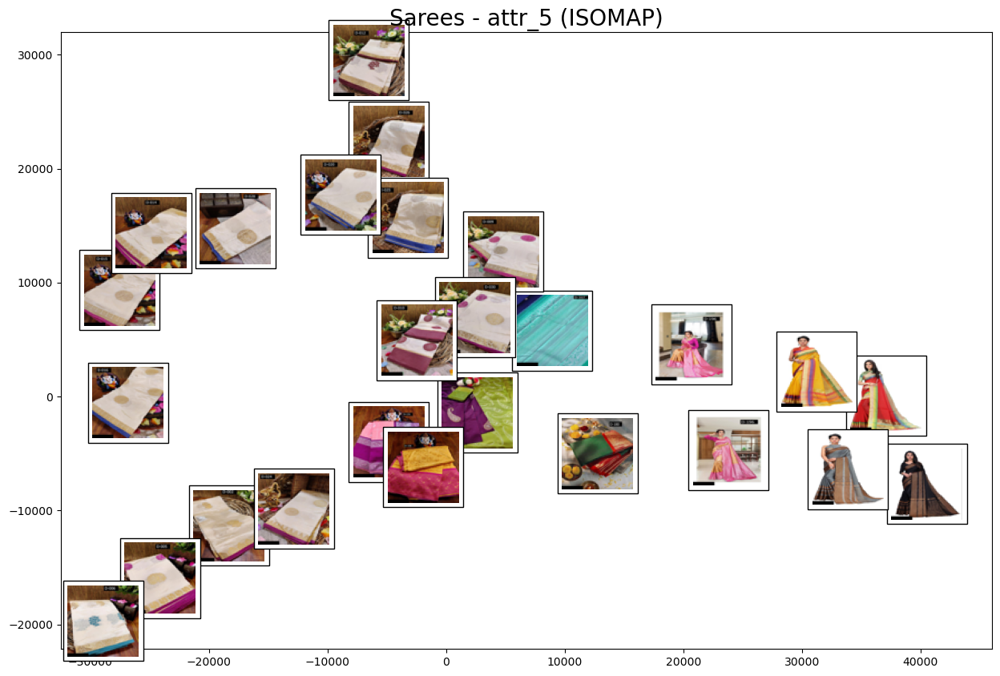

In [15]:

images_data, original_images = load_and_preprocess_images(sample_baskets[f"{category_name}_{attribute_name}"])
plot_with_model(images_data, isomap_model, original_images, title=f"{category_name} - {attribute_name} (ISOMAP)")


There are different clusters for sarees with floral patterns, another for plain sarees, and another for sarees with intricate embroidery. Within these clusters, sarees with similar color palettes are also grouped closely together.
For eg, sarees with 1 visible polka dots are clustered together regardless of color but within the cluster same colors are close.

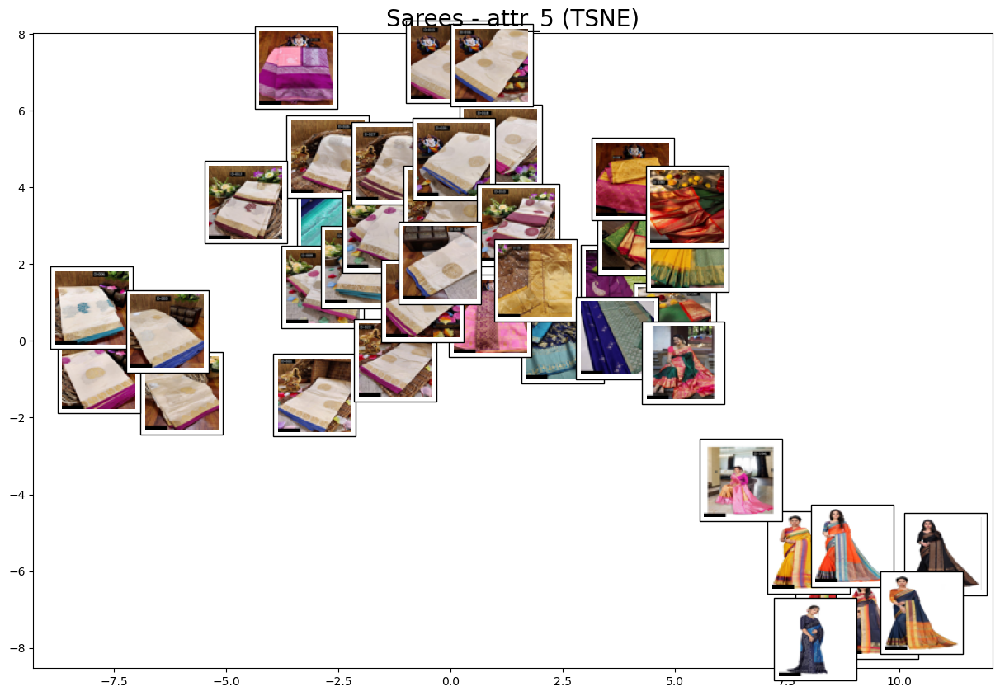

In [16]:
plot_with_model(images_data, tsne_model, original_images, title=f"{category_name} - {attribute_name} (TSNE)")


Here, images are clustered together on the basis of colors irresprective of pattern.

# Women Kurtis

Attribute 9

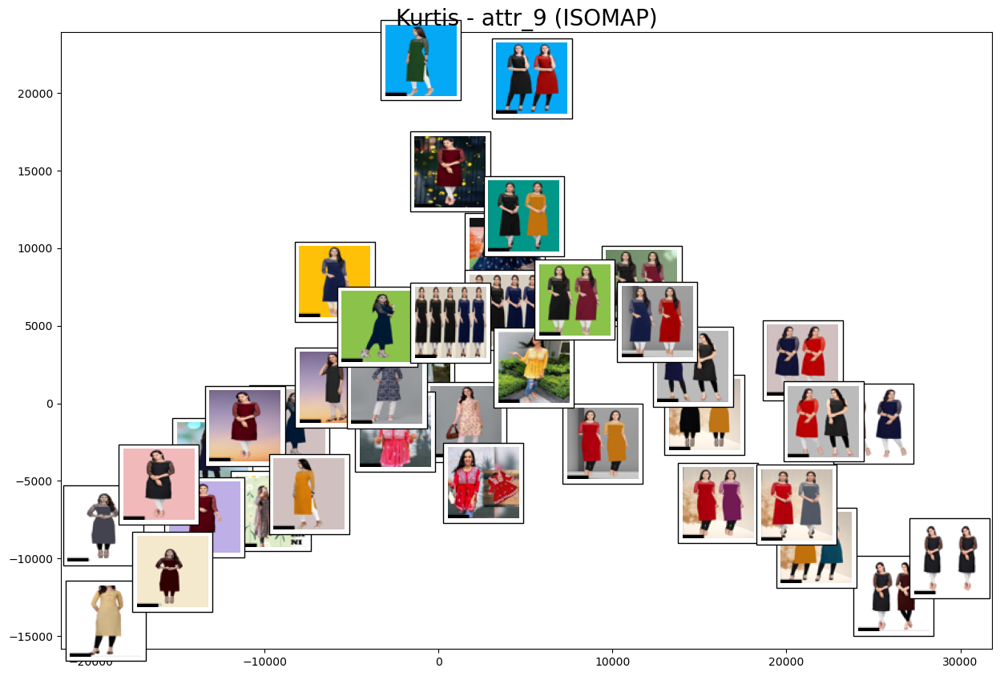

In [17]:
category_name = "Kurtis"
attribute_name = "attr_9"
images_data, original_images = load_and_preprocess_images(sample_baskets[f"{category_name}_{attribute_name}"])
plot_with_model(images_data, isomap_model, original_images, title=f"{category_name} - {attribute_name} (ISOMAP)")


The Isomap plot clusters kurtis based on their overall color scheme and pattern. There are distinct clusters for kurtis with similar color palettes (e.g., light colors, dark colors, bright colors) and patterns (e.g., floral, geometric, striped).

For example, there are clusters for kurtis with predominantly blue, red, and yellow color schemes.

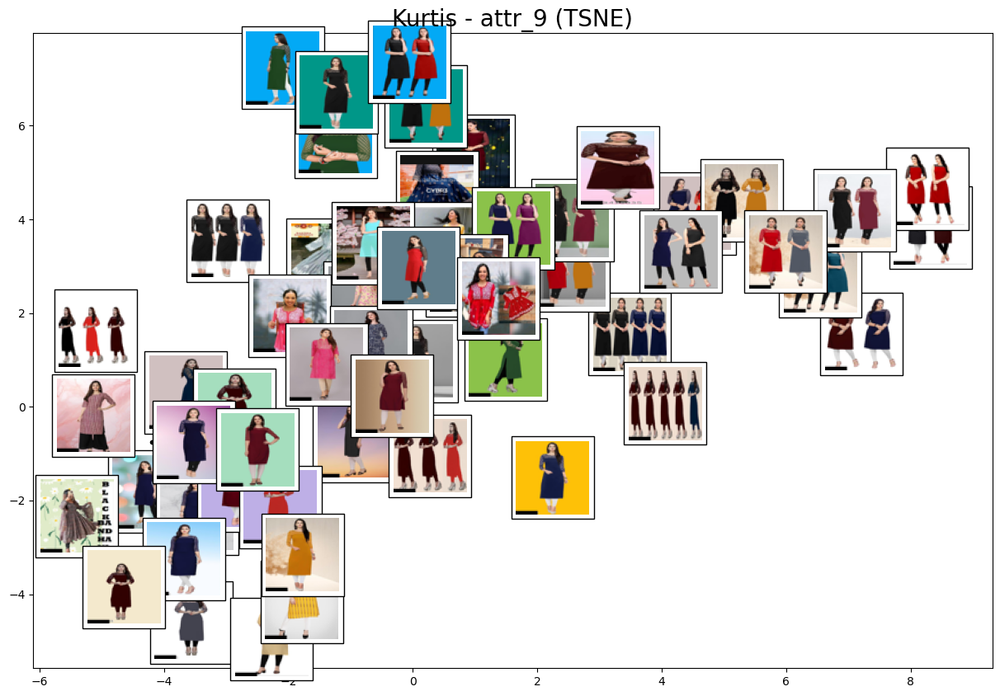

In [18]:
plot_with_model(images_data, tsne_model, original_images, title=f"{category_name} - {attribute_name} (TSNE)")


There are distinct clusters for kurtis with similar colors, patterns, and overall designs. For example, there's a cluster for kurtis with floral patterns, another for plain kurtis, and another for kurtis with intricate embroidery. Within these clusters, kurtis with similar color palettes are also grouped closely together.

Attribute 5

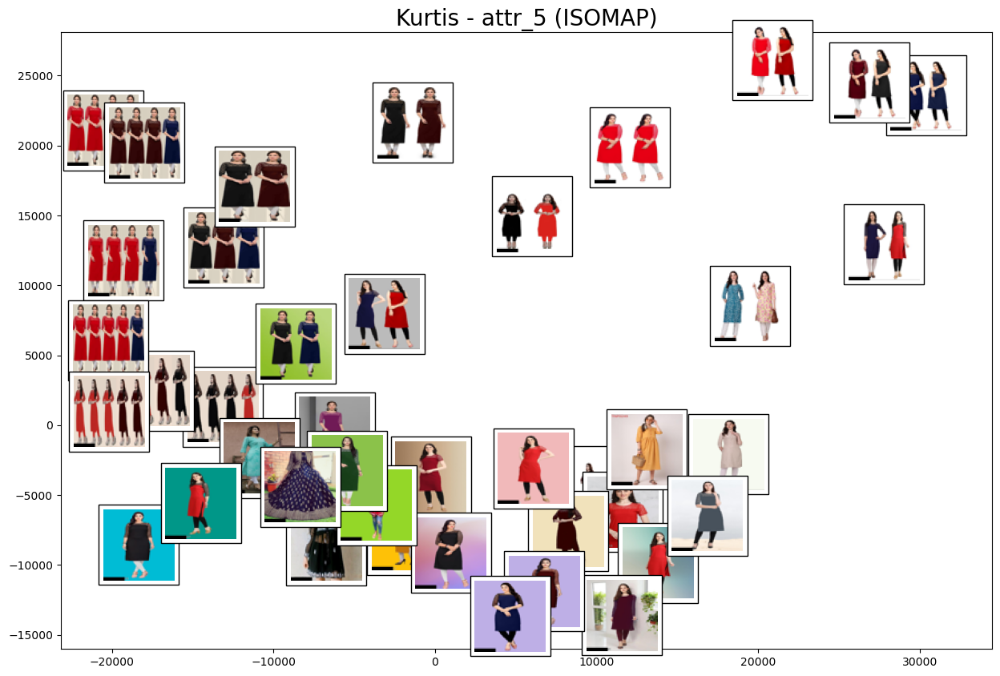

In [19]:

attribute_name = "attr_5"
images_data, original_images = load_and_preprocess_images(sample_baskets[f"{category_name}_{attribute_name}"])
plot_with_model(images_data, isomap_model, original_images, title=f"{category_name} - {attribute_name} (ISOMAP)")


The clustering seems to be predominantly on the basis of patters. within these patters, similar colored kurtis are huddled closely together.

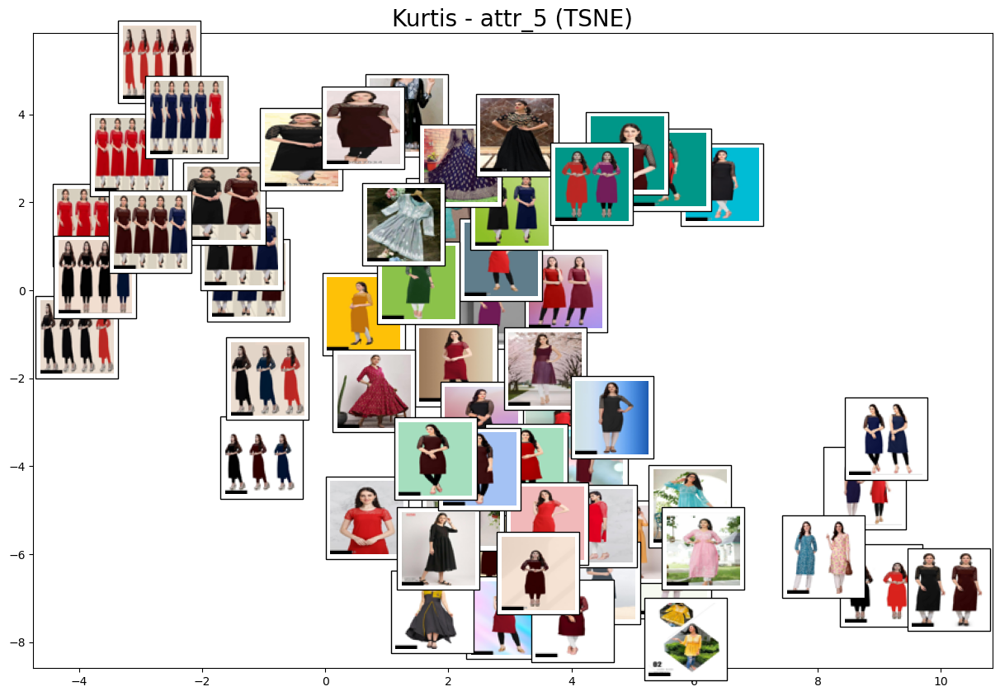

In [20]:
plot_with_model(images_data, tsne_model, original_images, title=f"{category_name} - {attribute_name} (TSNE)")


Clusering seems to be on the basis of dominant colors in the image.

# Women's T-shirts

Attribute 7

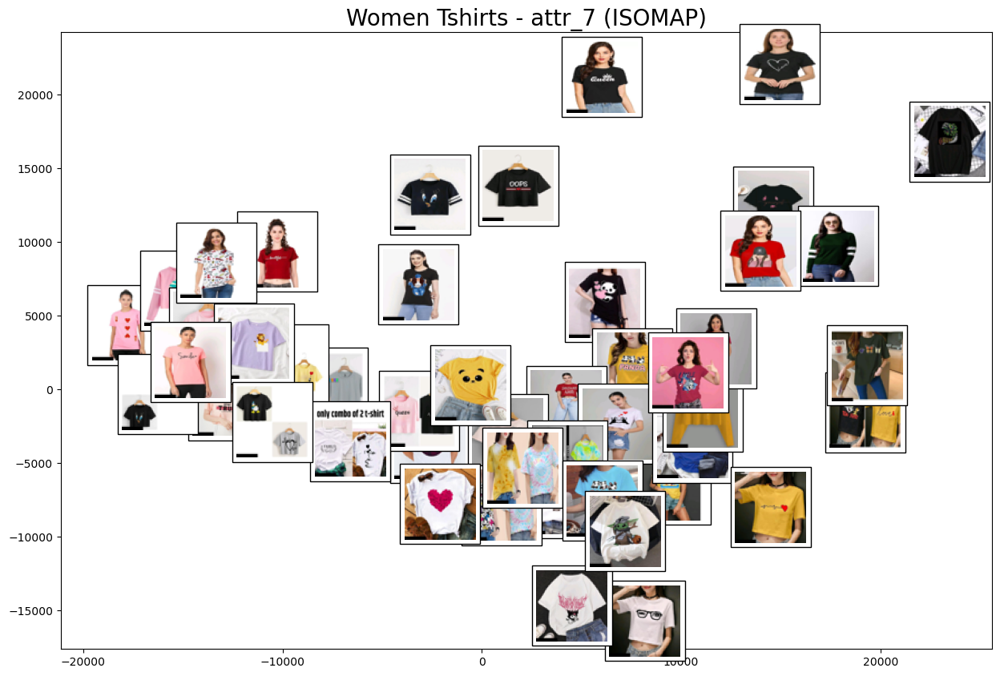

In [21]:
category_name = "Women Tshirts"
attribute_name = "attr_7"
images_data, original_images = load_and_preprocess_images(sample_baskets[f"{category_name}_{attribute_name}"])
plot_with_model(images_data, isomap_model, original_images, title=f"{category_name} - {attribute_name} (ISOMAP)")


The Isomap plot clusters women's t-shirts based on their overall style and color scheme. There are distinct clusters for t-shirts with similar colors (e.g., light colors, dark colors) and prints (e.g., cartoon characters, text-based, solid colors).









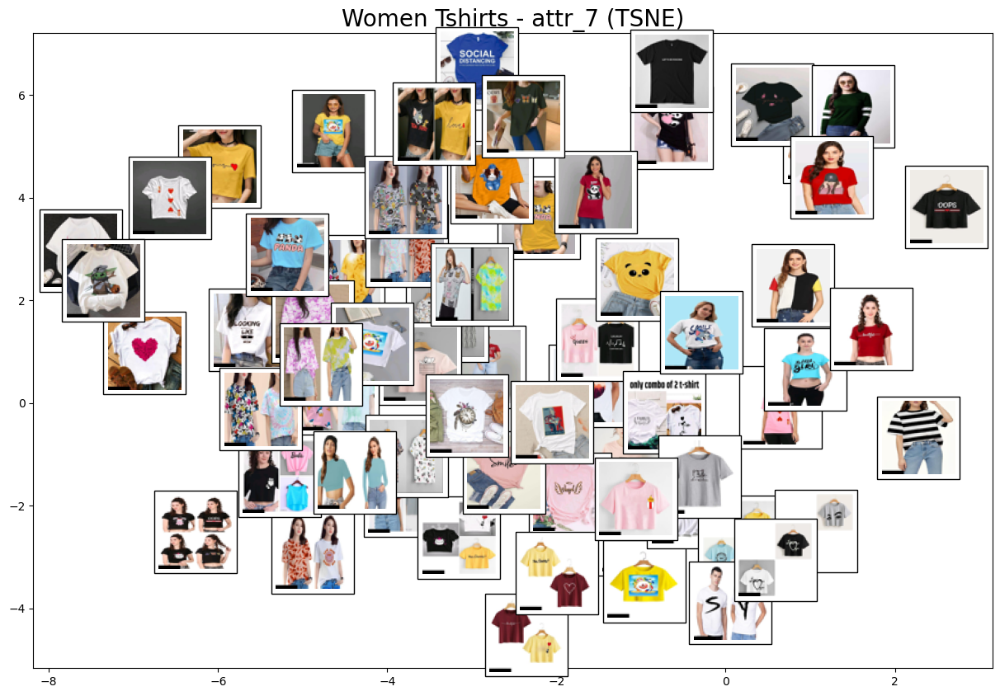

In [22]:
plot_with_model(images_data, tsne_model, original_images, title=f"{category_name} - {attribute_name} (TSNE)")


Clustering based on dominant pattern within which subclusters contain dominat colors as close points.

Attribute 1

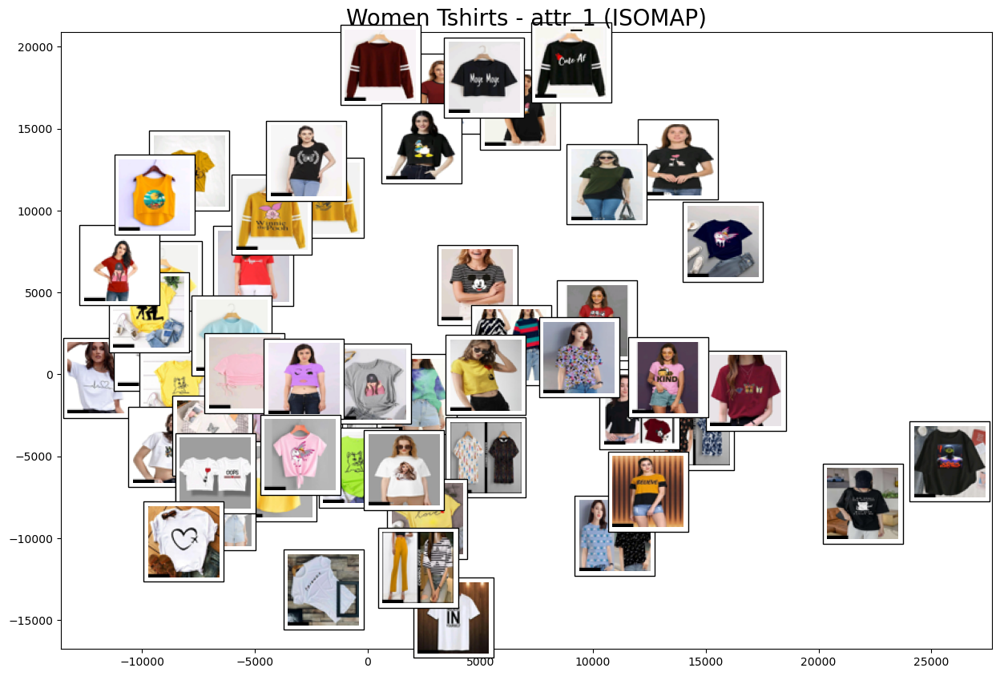

In [23]:
attribute_name = "attr_1"
images_data, original_images = load_and_preprocess_images(sample_baskets[f"{category_name}_{attribute_name}"])
plot_with_model(images_data, isomap_model, original_images, title=f"{category_name} - {attribute_name} (ISOMAP)")


Clustering based on dominant colors.

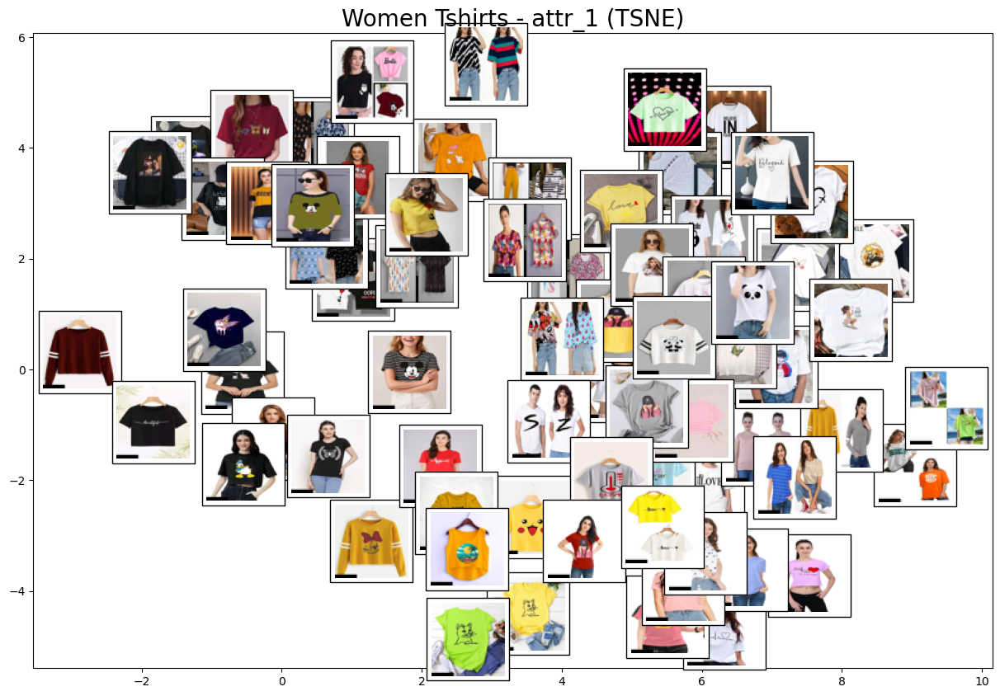

In [24]:
plot_with_model(images_data, tsne_model, original_images, title=f"{category_name} - {attribute_name} (TSNE)")


Clustering seems to be based on pattern irrespective of the color.

# Women's tops and tunics

Attribute 4

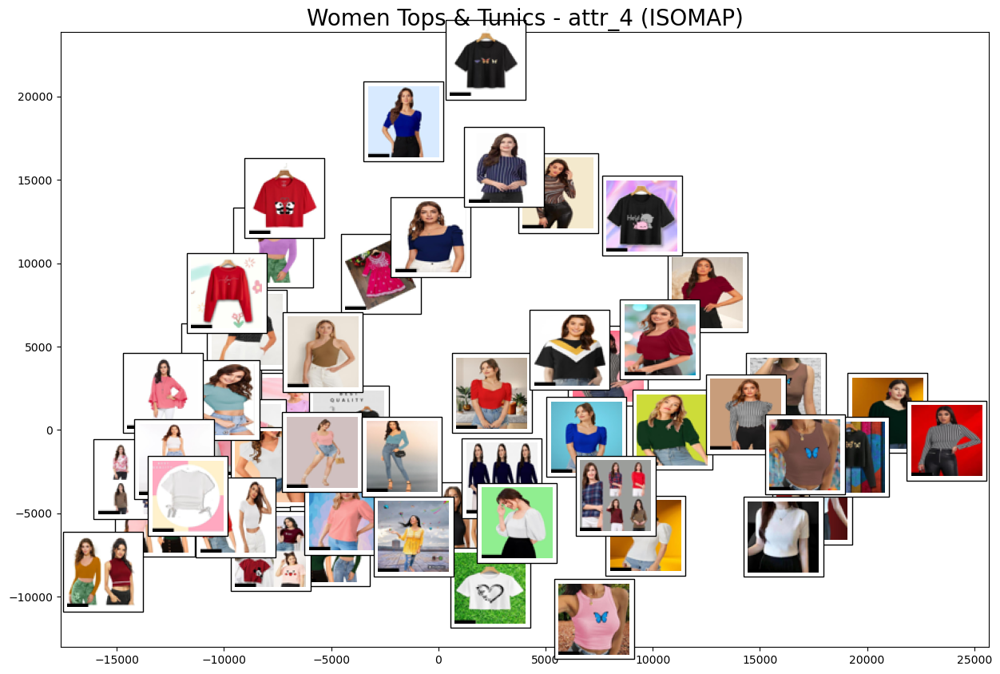

In [25]:

category_name = "Women Tops & Tunics"
attribute_name = "attr_4"
images_data, original_images = load_and_preprocess_images(sample_baskets[f"{category_name}_{attribute_name}"])
plot_with_model(images_data, isomap_model, original_images, title=f"{category_name} - {attribute_name} (ISOMAP)")


Clustering her is based on color irrespective of pattern. Similar and lighter shades are grouped together.

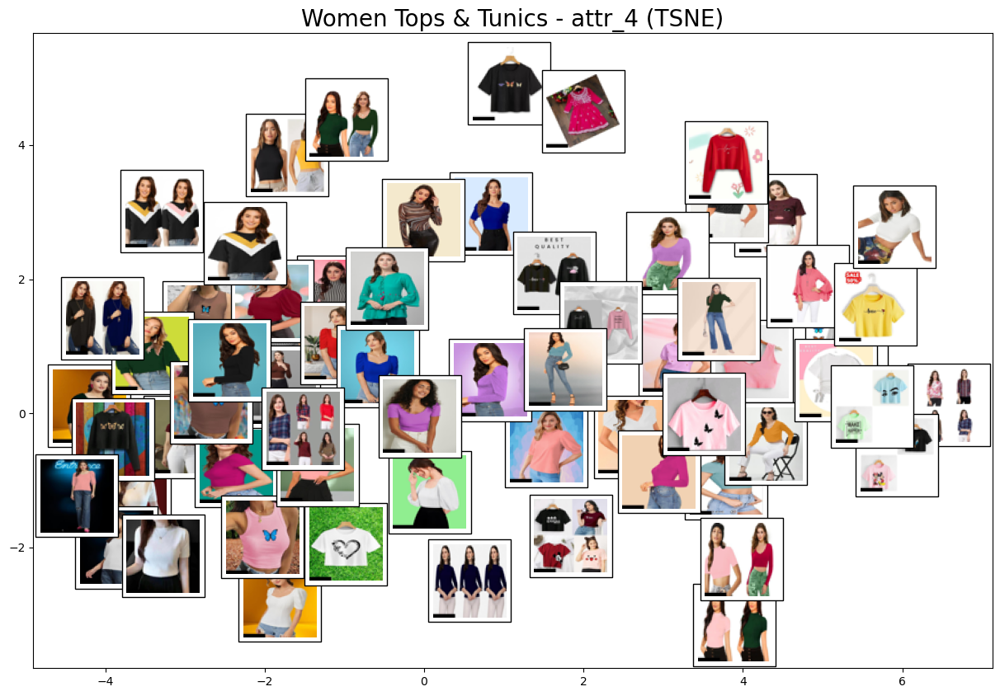

In [26]:
plot_with_model(images_data, tsne_model, original_images, title=f"{category_name} - {attribute_name} (TSNE)")


Dominant clustering is on the basis of style within which similar colors are grouped closer.

Attribute 1

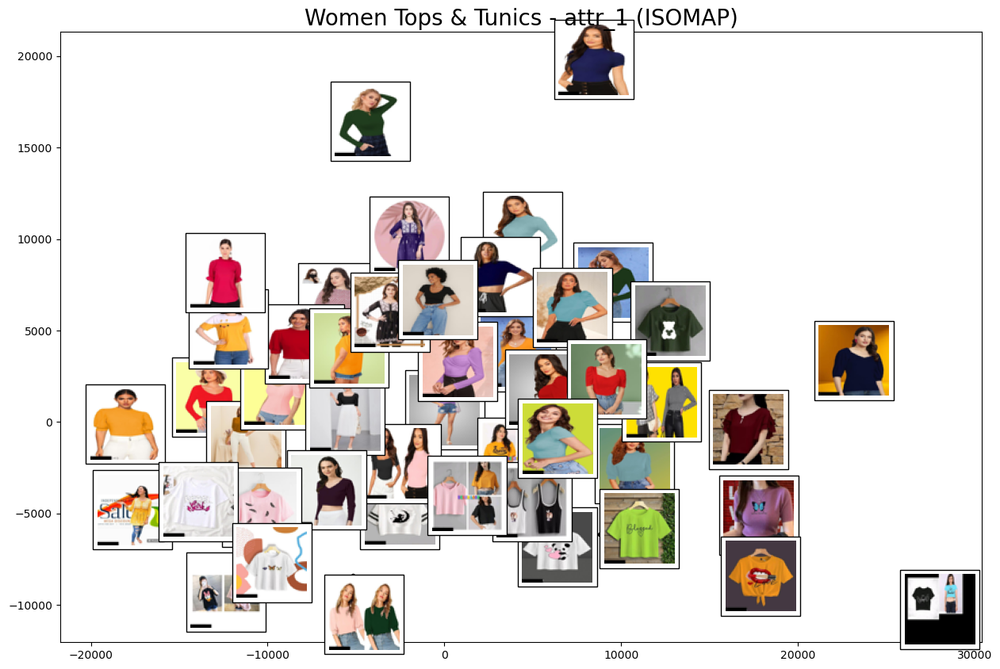

In [27]:

attribute_name = "attr_1"
images_data, original_images = load_and_preprocess_images(sample_baskets[f"{category_name}_{attribute_name}"])
plot_with_model(images_data, isomap_model, original_images, title=f"{category_name} - {attribute_name} (ISOMAP)")


There are distinct clusters for tops with similar colors (e.g., light colors, dark colors, bright colors) and patterns (e.g., floral, geometric, striped).

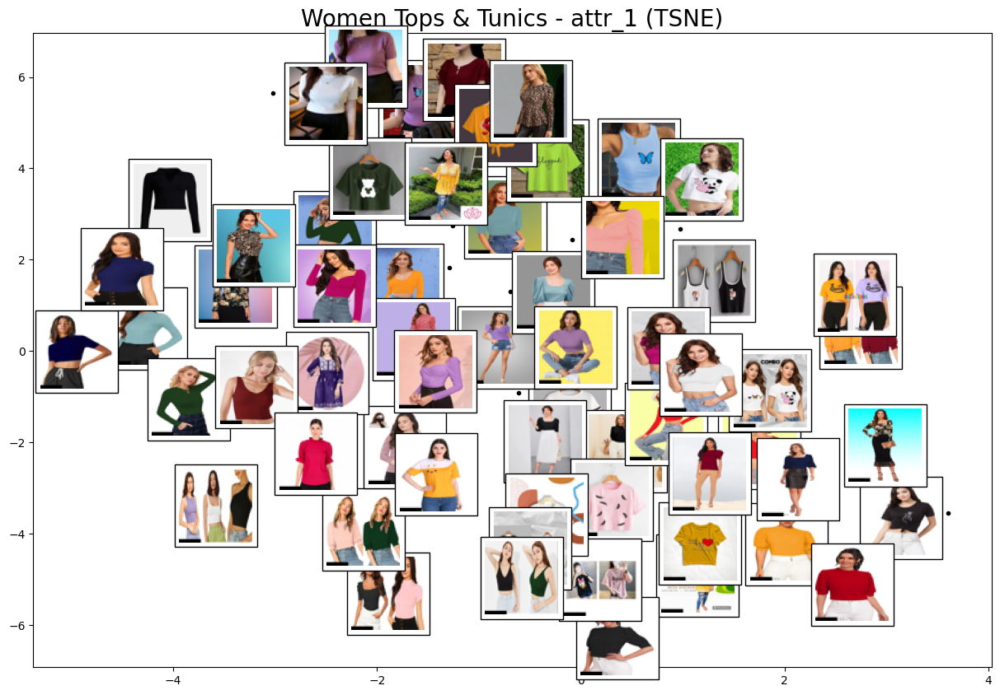

In [28]:
plot_with_model(images_data, tsne_model, original_images, title=f"{category_name} - {attribute_name} (TSNE)")

Here, clustering seems to be based on dominant color inclusing the color of background. i.r. similar background shades/ top shades are closer depending on which is more dominant.